# Customer Segmentation




This project aims to apply a collection of methods for unsupervised machine learning to find structure and determine relationships in the data. 

Specifically, the data used here consist of customers' transactions and will be used to investigate and interpret customer behaviour of a certain supplier. 

We start with an exploratory data analysis (EDA), and then we employ a variety of dimensionality reduction techniques. Visualizations will support the understanding of the representation in lower dimension, so we can identify occasional clusters based on behavior and detect differences between clusters. 


## Project Outline
**1**: Introduction

**2**: Exploratory Data Analysis

**3**: Principal Component Analysis

**4**: Kernel Principal Component Analysis

**5**: Grouping Algorithms and the Elbow Method

**6**: Interactive Cluster Analysis






## 1: Introduction
[The dataset can be accessed by clicking on this link](https://archive.ics.uci.edu/ml/datasets/Wholesale+customers). It is collated by Margarida G. M. S. Cardoso, and it is the customer's aggregated annual spending across different types of retail products (for example, Frozen, Grocery, Delicatessen, etc.). The identification of the pattern of purchases customers adopt can guide businesses to create products that will satisfy the majority of their clients, at the same time they don't waste energy in excessively complicated production lines or making products that will have to be too expensive to break even with the cost of production. These are some of the reasons to try and find groups in the population of customers based on their preferences as consumers and other types of behavior, depending on the business type. 


### References for further theoretical support. 
The concepts used in this project can be found in the links below:

- [Principal Component Analysis (PCA)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)
- [Kernel Principal Component Analysis (KPCA)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.KernelPCA.html)
- [Python Grouping Algorithms](https://hdbscan.readthedocs.io/en/latest/comparing_clustering_algorithms.html)
- [Elbow Method](https://www.scikit-yb.org/en/latest/api/cluster/elbow.html)




### Features

The data set has the annual amount spent by customer in each one of the product types described in features 1 to 6. Features 7 and 8 describe the type of venue and the geographical region respectively.


1) FRESH: annual spending of monetary units (m.u.) on fresh products (Continuous);

2) MILK: annual spending (m.u.) on milk products (Continuous);

3) GROCERY: annual spending (m.u.)on grocery products (Continuous);

4) FROZEN: annual spending (m.u.)on frozen products (Continuous)

5) DETERGENTS_PAPER: annual spending (m.u.) on detergents and paper products (Continuous)

6) DELICATESSEN: annual spending (m.u.)on and delicatessen products (Continuous);

7) CHANNEL: customers' Channel - Horeca (Hotel/Restaurant/Cafe) or Retail channel (Nominal with 2 possible values)

8) REGION: customers' Region are Lisbon, Porto or Other (Nominal with 3 possible values)



The goal of this project is to find what groups of customers are there in the data set, and some of the methods will be applied to go further into the question if there are any groups whatsoever. 


In [242]:
# Import libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA

from sklearn.cluster import KMeans, AffinityPropagation, MeanShift, SpectralClustering, AgglomerativeClustering, DBSCAN
import hdbscan
from yellowbrick.cluster import KElbowVisualizer
import scipy.cluster.hierarchy as sch


In [162]:
df = pd.read_csv('Data/Wholesale customers data.csv')

In [163]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [164]:
# Correcting orthography and remapping categorical features.

df = df.rename(columns={'Delicassen': 'Delicatessen'})
df['Channel'] = df['Channel'].map({1: 'HoReCa', 2: 'Retail'})
df['Region'] = df['Region'].map({1: 'Lisbon', 2: 'Porto', 3:'Other'})

## Exploratory Data Analysis (EDA)


In [165]:
# Frequencies of the nominal variables

df.Region.value_counts()

Other     316
Lisbon     77
Porto      47
Name: Region, dtype: int64

In [166]:

df.Channel.value_counts()

HoReCa    298
Retail    142
Name: Channel, dtype: int64

In [167]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [168]:
# Create an object with the features list. 

features = df.columns.tolist()

In [169]:
# Descriptive statistics of the numerical features. 

df[features].describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


In [170]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [171]:
# Save the processed data (checkpoint). 

df.to_csv('Data/data_processed.csv')
df = pd.read_csv('Data/data_processed.csv', index_col = 0)

/Users/klebert/anaconda3/lib/python3.7/site-packages/pandas/plotting/_tools.py:307: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/klebert/anaconda3/lib/python3.7/site-packages/pandas/plotting/_tools.py:307: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/klebert/anaconda3/lib/python3.7/site-packages/pandas/plotting/_tools.py:307: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/klebert/anaconda3/lib/python3.7/site-packages/pandas/p

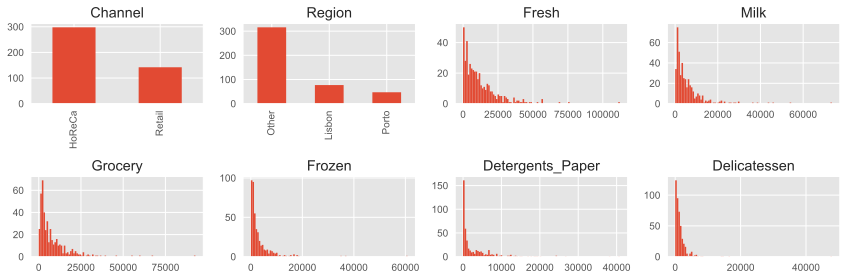

In [172]:
# Visualization of all features on a 2x4 grid

fig, axes = plt.subplots(2, 4, figsize=(12, 4))

for feature, ax in zip(features, axes.ravel()):
    if (feature=='Channel') | (feature=='Region'):
        df[feature].value_counts().plot.bar(ax=ax)
    else:
        ax.hist(df[feature], bins=100)  # categorical variables as histogram
    ax.set_title(feature)
plt.tight_layout()  

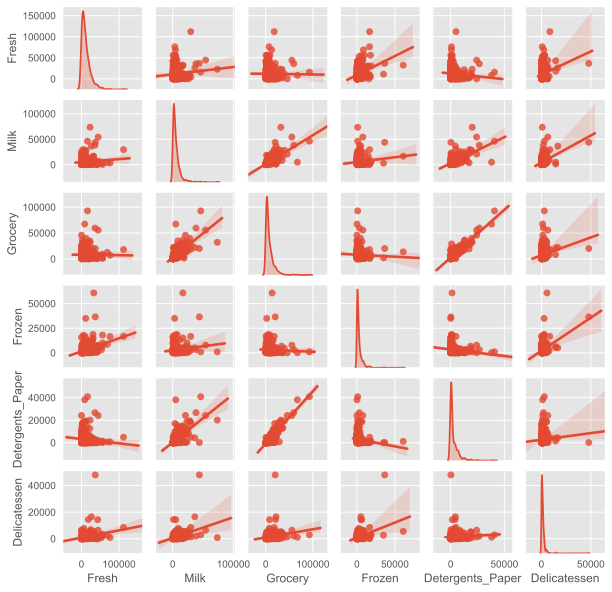

In [173]:
# Examining the relationship between features with Seaborn's pairplot. 

pplot = sns.pairplot(df, vars=features[2:], kind = 'reg', diag_kind='kde')
pplot.fig.set_size_inches(8, 8)

## Values Decomposition

### Principal Component Analysis


[PCA decomposition](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) finds the orthogonal axis that maximizes the variance in a lower dimensional space. Each feature is centered but not scaled, and because its purpose is to detect the maximum variance axis, the analysis can be drastically skewed if features are not scaled to unitary variance. 

In [174]:
# Categorical features are not scaled as their values have no quantitative meaning. 

features = [
#     'Channel',
#     'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]

# Select the numerical features. 

data = df[features].to_numpy()

In [175]:
# Standardization with StandardScaler

scaler = StandardScaler()
data = scaler.fit_transform(data)
## To check that std = 1
# data[:, 0].std()

/Users/klebert/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/klebert/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [176]:
# Saving the np array
np.save('Data/training_data.npy', data)


In [177]:
# PCA to reduce to a 2D space. 

pca = PCA(n_components=2)
res_pca = pca.fit_transform(data)

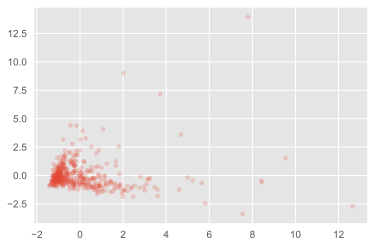

In [178]:
# Check on the dispersion of data in the 2-dimensional space

plt.scatter(res_pca[:, 0], res_pca[:, 1], s=16, alpha=0.2)

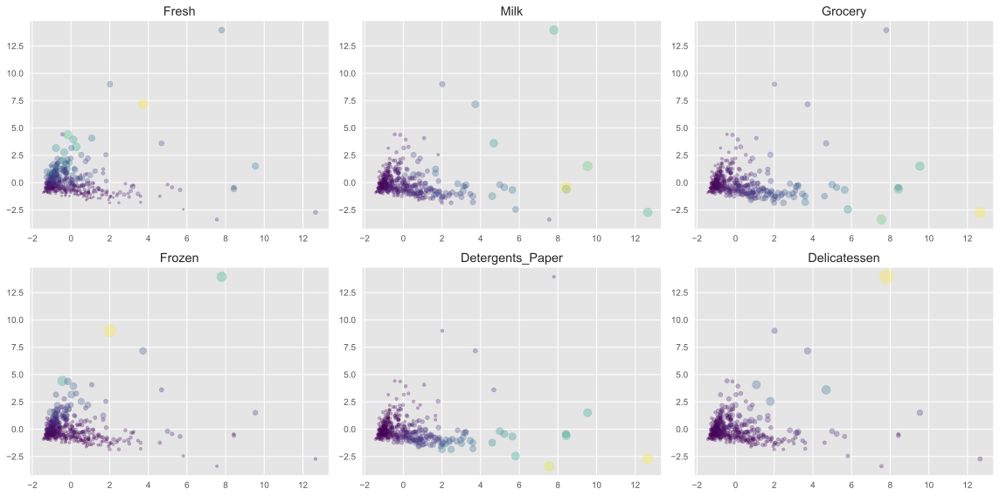

In [179]:

# Separating the dispersion for each feature. Each data point is a customer, and the size represents the value for that feature (with a 20 offset and multiplied by 15). 

fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20+15*data[:, features.index(feature)] # The sizes are the normalized values for that specific feature. 
    ax.scatter(res_pca[:, 0], res_pca[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

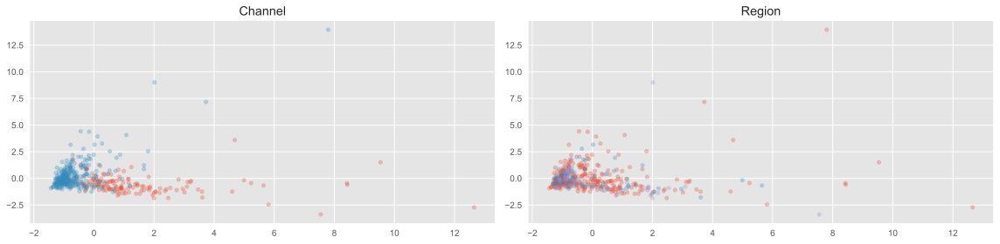

In [180]:
# Visualization taking categorical features into account. 


fig, axes = plt.subplots(1, 2, figsize=(16, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20 
    for unique_val in df[feature].unique():
        ax.scatter(res_pca[df[feature]==unique_val, 0], res_pca[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

The plots above don't show a clear separation for the data points based on the Region feature, unlike the "Channel" that seem to be more relevant for this segmentation. The numerical variables also don't show a clear way for a linear separation between points, so we try kernel transformations before the dimensionality reduction next. 

### Kernel Principal Component Analysis

### Kernel = Polynonial Function




When the data is not linearly separable we can apply [kernels](https://scikit-learn.org/stable/modules/metrics.html#metrics) that possibly can make this separation feasible minimizing errors. For more details on the parameters and attributes [check the documentation](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.KernelPCA.html). 

For polynomial kernels, the basic format is: 

$$k(x, y) = (\gamma x^\top y +c_0)^d$$

where: 

**x, y, are the input vectors**

**d is the kernel degree**

if $c_0 = 0$ the kernel is said to be homogenous

In [181]:
# load the data

df = pd.read_csv('Data/data_processed.csv', index_col=0)
data = np.load('Data/training_data.npy')

In [182]:
kpca = KernelPCA(n_components=2, kernel='rbf', degree=2)
res_kpca_poly = kpca.fit_transform(data)

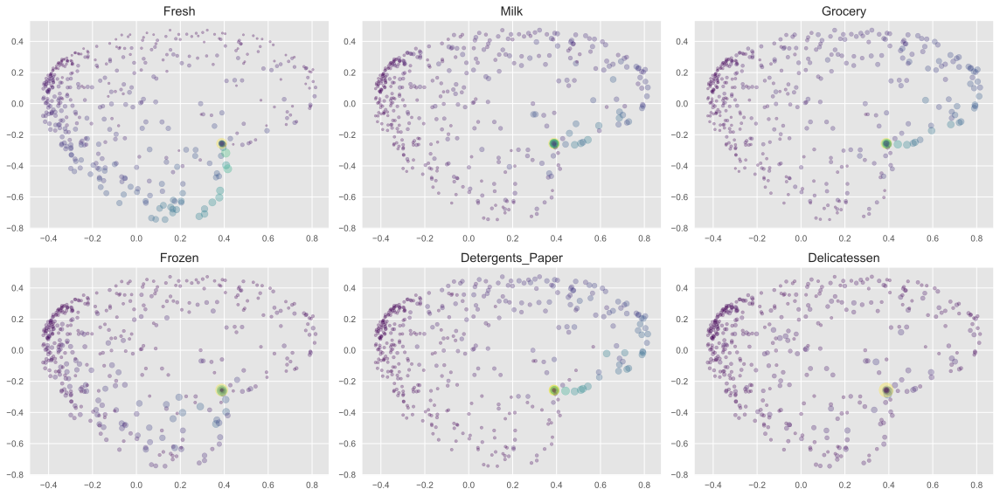

In [183]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20+15*data[:, features.index(feature)]
    ax.scatter(res_kpca_poly[:, 0], res_kpca_poly[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

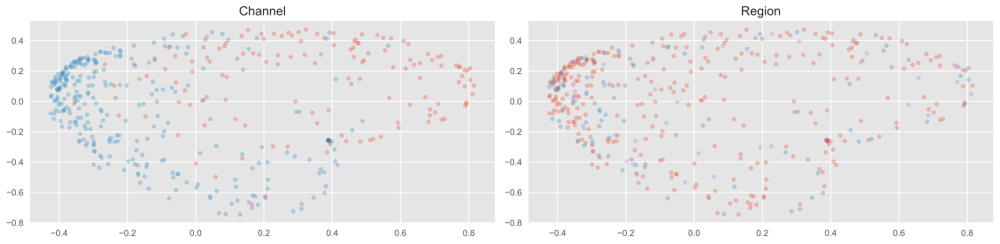

In [184]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_poly[df[feature]==unique_val, 0], res_kpca_poly[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

### Kernel = Radial Basis Function


The better the continuous trend of value change can be detected the more separable the data points are. 

As the bigger the points the higher the amount spent in that category, it is necessary to be able to separate points of different sizes in order to detect distinct shopping behavior profiles. 

We try a Radial Basis Function kernel calculated between the vectors. It is defined as: 

$$k(x, y) = \exp( -\gamma \| x-y \|^2)$$

where $x$ and $y$ are input vectors. If $\gamma = \sigma^{-2} $ the kernel is known as the Gaussian kernel of variance $\sigma^{2}$.

In [185]:
kpca = KernelPCA(n_components=2, kernel='rbf', gamma=0.05)
res_kpca_rbf = kpca.fit_transform(data)

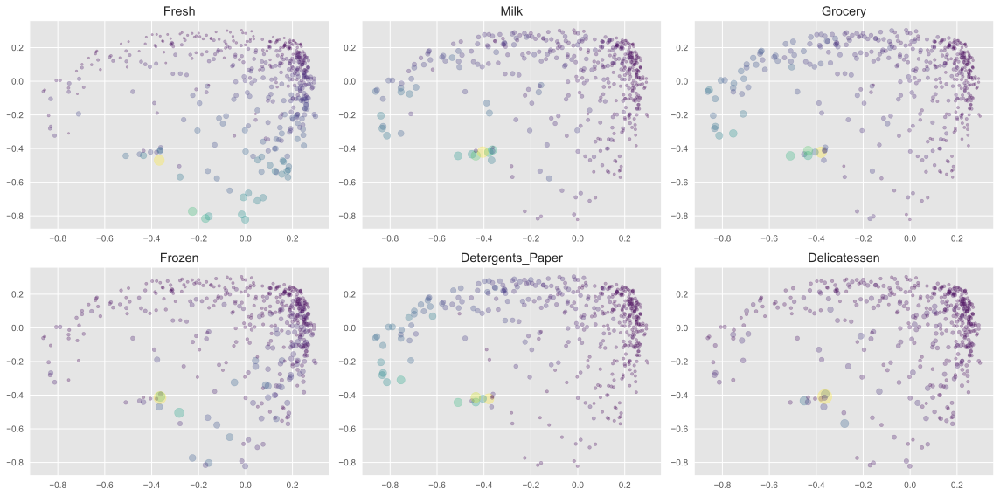

In [186]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()): 
    cols = 'viridis'
    sizes = 20+15*data[:, features.index(feature)]
    ax.scatter(res_kpca_rbf[:, 0], res_kpca_rbf[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

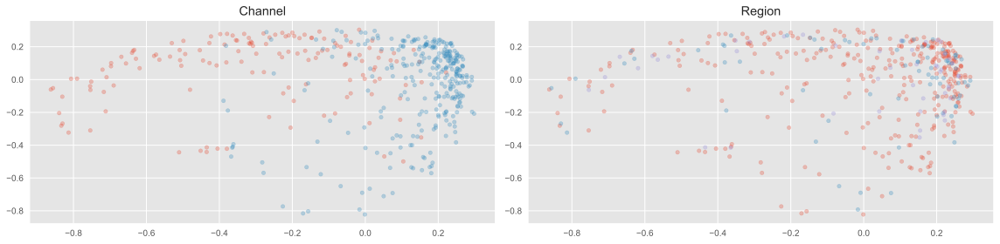

In [187]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_rbf[df[feature]==unique_val, 0], res_kpca_rbf[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

### Kernel = Cosine Function

Finally we apply the cosine function kernel, which computes the L2-normalized dot product of vectors. If $x$ and $y$ are row vectors, their cosine similarity $k$ is defined as: 

$$k(x, y) = \frac{x y^\top}{\|x\| \|y\|}$$

In [188]:
kpca = KernelPCA(n_components=2, kernel='cosine')
res_kpca_cos = kpca.fit_transform(data)

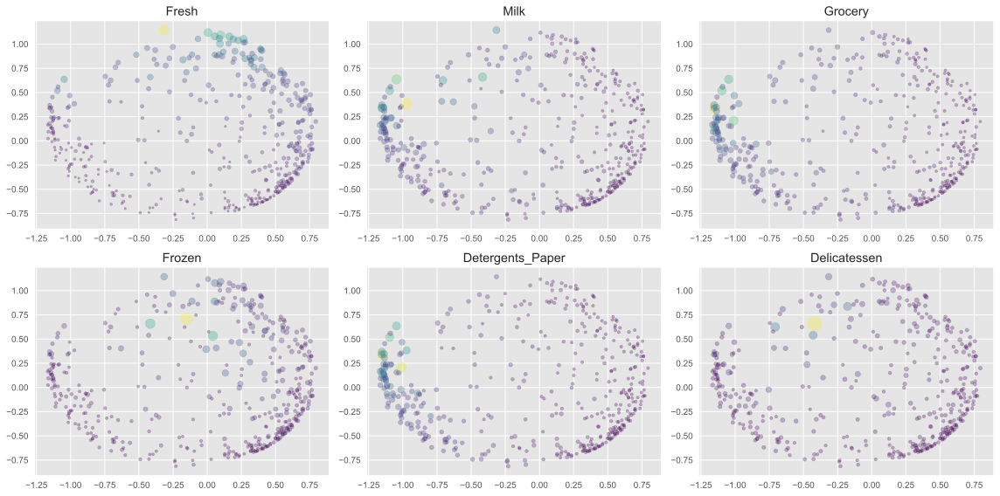

In [189]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20+15*data[:, features.index(feature)]
    ax.scatter(res_kpca_cos[:, 0], res_kpca_cos[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

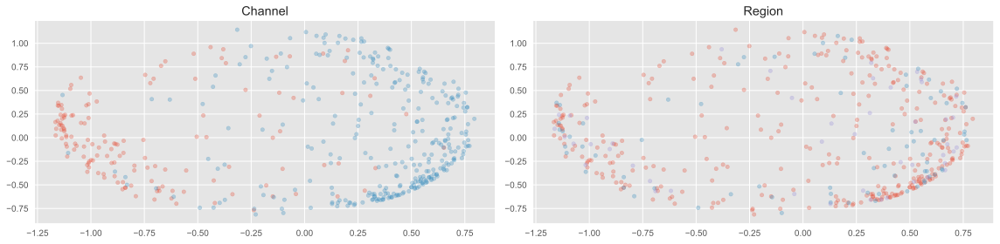

In [190]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_cos[df[feature]==unique_val, 0], res_kpca_cos[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

In summary, an intuitive way to interpret these plots is the clearer the transition the better the performance to be expected on the grouping procedure to follow. 

We now append these kernel transformed decompositions to the DataFrame

In [191]:
df['x_kpca_rbf'] = res_kpca_rbf[:, 0]
df['y_kpca_rbf'] = res_kpca_rbf[:, 1]

df['x_kpca_poly'] = res_kpca_poly[:, 0]
df['y_kpca_poly'] = res_kpca_poly[:, 1]

df['x_kpca_cos'] = res_kpca_cos[:, 0]
df['y_kpca_cos'] = res_kpca_cos[:, 1]

In [192]:
# Save
df.to_csv('Data/data_with_latent.csv')

## Grouping Algorithms



## K-Means

K-Means is one of the most well known grouping algorithms and many mistake it for a clustering algorithm. Instead, it partitions the data in $k$ parts regardless of those perhaps not being a cluster. 

The segments created by K-Means partitioning are assumed to be globular in shape, with a diameter surrounding one of the $k$ centroids. That assumption can limit the ability to describe events in real applications. 



In [193]:
# We load the latent components we calculated and saved above.

df = pd.read_csv('Data/data_with_latent.csv', index_col=0)
data = np.load('Data/training_data.npy')

The $k$ number of partitions can be chosen arbitrarily, or guided by some business specific knowledge. Alternatively, there are more "data driven" methods to perform this task. 

As an example, let's try to segment in 6 parts defining $K = 6$ and using the components resulting from the radial basis function kernel derived principal components.

In [194]:
# Load the components
res_kpca = df[['x_kpca_rbf', 'y_kpca_rbf']].to_numpy()


In [195]:
clusterer = KMeans(n_clusters=5)
clusters = clusterer.fit_predict(res_kpca)

In [196]:
# Check on the values that represent the cluster labels that were assigned to the first 10 points of the data set. 

clusters[:10]

array([0, 0, 0, 4, 4, 1, 1, 0, 1, 3], dtype=int32)

In [197]:
# Define some markers for the clusters, in the order of the clusters. 0 = *, 1 = h...

markers = list('*hH+oXDd|.,ov^<>12348spP') 

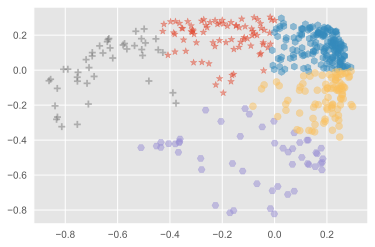

In [198]:
for cluster in np.unique(clusters):
    cluster_data = res_kpca[clusters==cluster]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], alpha=0.5, marker=markers[cluster])

There are 6 groups, despite no clear distinction between some of them. 

Let's visualize the data adding the size in the visualization and separate plots for each feature. 

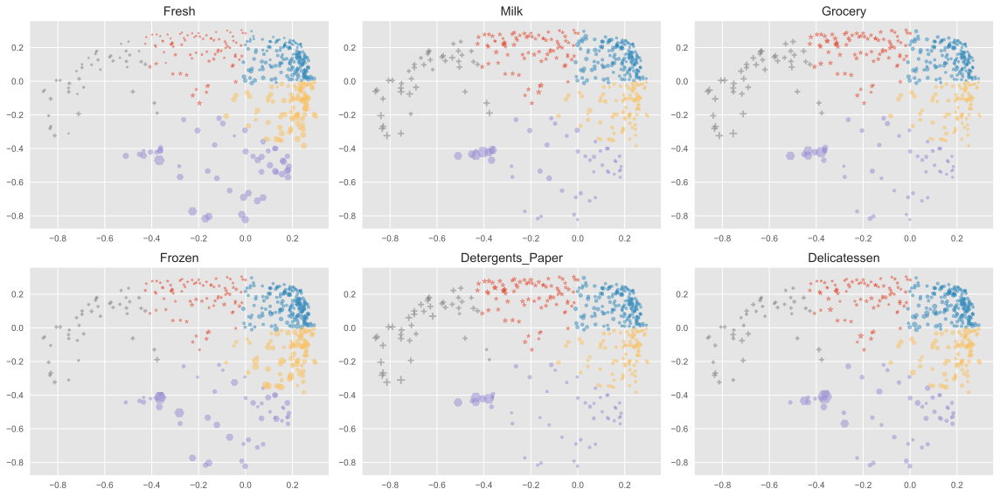

In [199]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    for cluster in np.unique(clusters):
        sizes = 20+15*data[:, features.index(feature)][clusters==cluster]
        cluster_data = res_kpca[clusters==cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], s=sizes, alpha=0.5, cmap=cols, marker=markers[cluster], label=f'Cluster {cluster}')
    ax.set_title(feature)
plt.tight_layout()

In [200]:
df['cluster_kpca_rbf_kmeans'] = clusters
df.to_csv('Data/data_with_clusters.csv')

### Elbow Method (aka Knee Method)

Basically, segmenting the data points in groups should be useful to explain variation in the data. If you plot the $k$ against the distortion score or error (distance between points and the centroids) and there's no inflection point - the elbow or knee - then the methods might not be working. I means that segmenting the data is not useful to reduce uncertainty or explain the structure of the data. It is a common heuristic to inferring the number of clusters in a data set, and it is also used to guide the choice of the best number of principal components to describe the data set in PCA. 




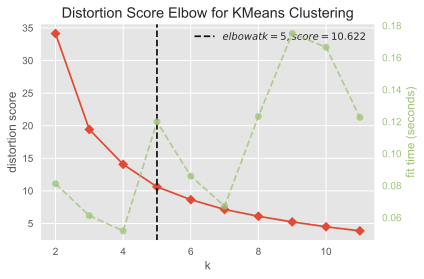

In [201]:
clusterer = KMeans()
visualizer = KElbowVisualizer(clusterer, k=(2, 12), metric='distortion')

visualizer.fit(res_kpca)        
visualizer.show()

The elbow method points to $k = 5$ being the optimal number of centroids. Other methods can be explored to segment the data set in meaningful and useful ways. One of them is inspecting the relationships between similar sets of data can be defined by taking the longest vertical line without any horizontal line crossing it in a dendrogram. 






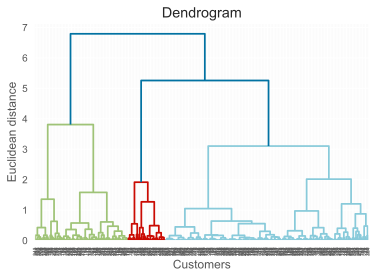

In [202]:

dendrogram = sch.dendrogram(sch.linkage(res_kpca, method = 'ward')) # the ward method minimizes the variance between clusters



plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distance')
plt.show()

The relationships between data in the dendrogram above immediately show there is a difference in the size of the groups that the data points belong. 

Additionally, the algorithm suggests that the data is distributed in 3 distinguishable groups of data in the lower dimensional space, and they are shown in the 3 different colors. 

We can move on from K-Means partitioning of the data and apply algorithms that use other assumptions, and provide more flexibility to describe fenomena. 


## Agglomerative Clustering

This algorithm defines each data point as belonging to its own cluster, and then starts to merge the clusters from the bottom up. As a result, the datum count of each partition doesn't have to be defined a priori nor equal to the other partitions. 



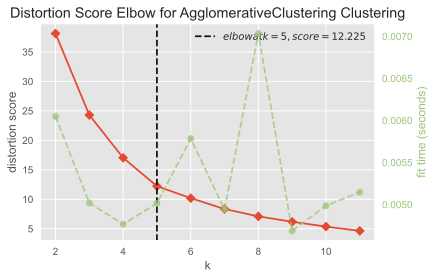

In [203]:
clusterer = AgglomerativeClustering()
visualizer = KElbowVisualizer(clusterer, k=(2, 12), metric='distortion')

visualizer.fit(res_kpca)        
visualizer.show()

Let's proceed the Agglomerative Clustering with the recommended number of clusters.

In [204]:
clusterer = AgglomerativeClustering(n_clusters=5)
clusters = clusterer.fit_predict(res_kpca)

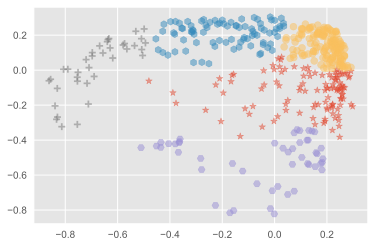

In [205]:
for cluster in np.unique(clusters):
    cluster_data = res_kpca[clusters==cluster]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], alpha=0.5, marker=markers[cluster])

There is sensible difference in the shape of partitions when compared to K-Means partitioning. Now we visualize the partitions in the same grid as before, by numerical feature. 

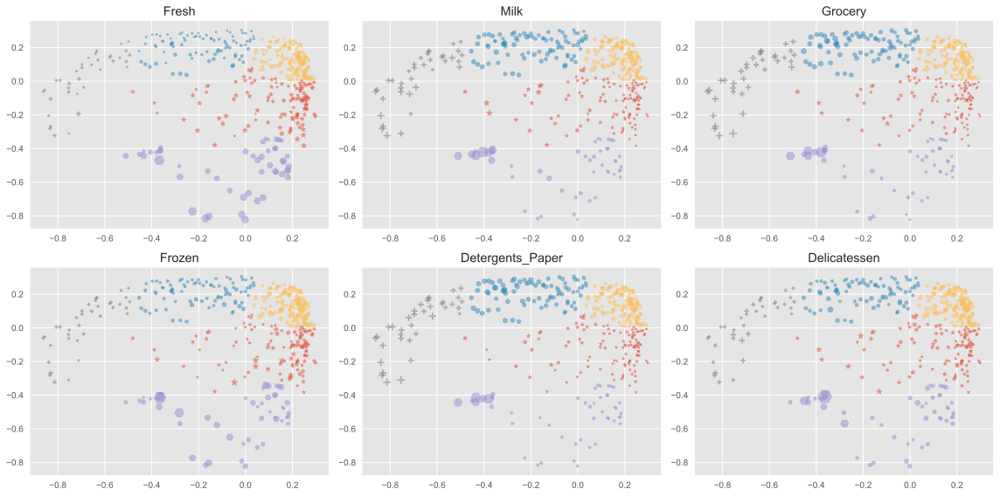

In [206]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    for cluster in np.unique(clusters):
        sizes = 20+15*data[:, features.index(feature)][clusters==cluster]
        cluster_data = res_kpca[clusters==cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], s=sizes, alpha=0.5, cmap=cols, marker=markers[cluster], label=f'Cluster {cluster}')
    ax.set_title(feature)
plt.tight_layout()

In [207]:
df['cluster_kpca_rbf_agg'] = clusters
df.to_csv('Data/data_with_clusters.csv')

## Hierarchical Density-Based Spatial Clustering of Applications with Noise (HDBSCAN)

This is considered to be a truly clustering algorithm, unlike those applied above. It looks for density area in the data set and deforms the space in order to increase the distance between the dense areas and the disconnected data points, that are now considered part of the background noise. 

One of the parameters is $\epsilon$, which defines a threshold for cluster size. Clusters with fewer than $\epsilon$ members are merged with others forming a bigger one. Because HDBSCAN searches over many different $\epsilon$ values the clusters are not restrained regarding their density. 

In summary, the algorithm detects clusters only if they're meaningfully more dense than the assumed background noise. These clusters have no restriction of shape or density. The number of clusters is not defined a priori, as it emmerges from the analysis of the data points disposition in the sample space. For more information, check [the documentation on HDBSCAN](https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html).

In [208]:
# The parameters to be defined include the minimum cluster size. 


clusterer = hdbscan.HDBSCAN(min_cluster_size=6, gen_min_span_tree=True)
clusters = clusterer.fit_predict(res_kpca)

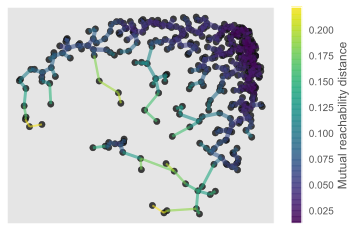

In [209]:
# We can now check on the minimum spanning tree of the mutual reachability graph generated by HDBSCAN. 

clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis', 
edge_alpha = 0.6, 
node_size = 40, 
edge_linewidth = 2)


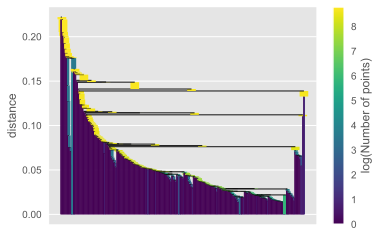

In [210]:
# Another visualization for the hierarchical structure is the single linkage tree plot: 

clusterer.single_linkage_tree_.plot(cmap='viridis' , colorbar=True)


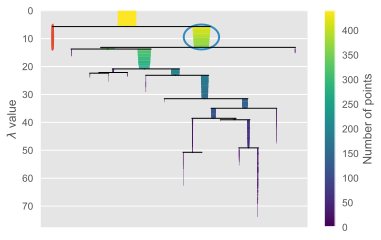

In [211]:
clusterer.condensed_tree_.plot(select_clusters=True, selection_palette = sns.color_palette())

The number of true clusters detected by the algorithm depend then on the minimum number of members we accept to define a cluster. Let's inspect the clusters detected in the 2D KPCA space. 



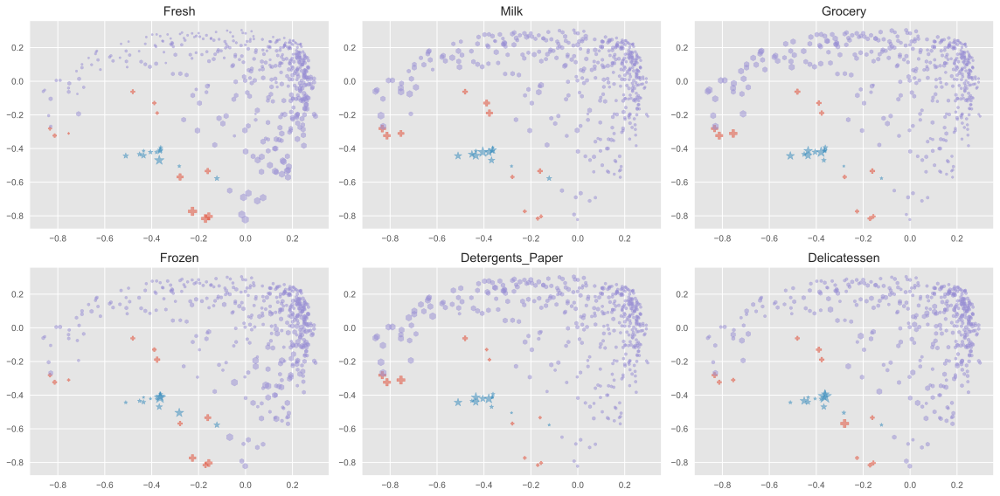

In [212]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    for cluster in np.unique(clusters):
        sizes = 20+15*data[:, features.index(feature)][clusters==cluster]
        cluster_data = res_kpca[clusters==cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], s=sizes, alpha=0.5, cmap=cols, marker=markers[cluster], label=f'Cluster {cluster}')
    ax.set_title(feature)
plt.tight_layout()

In [213]:
df['cluster_kpca_rbf_hdbscan'] = clusters
df.to_csv('Data/data_with_clusters.csv')

## Cluster Distribution and Profile Analysis

One popular way to visualize and emphasize the differences between objects/agents/individuals/states with multidimensional characteristics is the polar scatter plot. Data must be normalized in order to adjust the dimensions in a way we can perceive, that is, all features in the same order of magnitude. 



In [215]:
# Checking on the labels in the KMeans grouping and taking the mean values of the features of interest. 
df.groupby(['cluster_kpca_rbf_kmeans', 'Channel', 'Region'])[features].mean()

Fresh          Milk  \
cluster_kpca_rbf_kmeans Channel Region                               
0                       HoReCa  Lisbon   5620.000000  10123.400000   
                                Other    3300.769231   6994.153846   
                        Retail  Lisbon   3341.571429   7110.714286   
                                Other    6066.140000   7637.520000   
                                Porto    2993.500000   8762.333333   
1                       HoReCa  Lisbon   6017.600000   2914.133333   
                                Other    5955.690265   2470.274336   
                                Porto    7070.600000   1708.266667   
                        Retail  Lisbon   2790.000000   2527.000000   
                                Other   11753.230769   4582.230769   
                                Porto   10708.666667   3779.666667   
2                       HoReCa  Lisbon  37747.142857   6045.857143   
                                Other   39183.750000   6478.281250   
                                Porto   32717.000000  16784.000000   
                        Retail  Other   30796.400000  28588.500000   
                                Porto    8565.000000   4980.000000   
3                       HoReCa  Lisbon   5909.000000  23527.000000   
                                Other   10683.000000  21858.000000   
                        Retail  Lisbon   4445.625000  16237.500000   
                                Other    5790.538462  15121.500000   
                                Porto    5135.571429  13998.142857   
4                       HoReCa  Lisbon  17654.125000   1528.312500   
                                Other   18226.980769   2625.480769   
                                Porto   15619.916667   1842.583333   
                        Retail  Lisbon  15927.000000   5955.000000   
                                Other   19615.166667   5419.500000   
                                Porto   21952.500000   3872.500000   

                                             Grocery        Frozen  \
cluster_kpca_rbf_kmeans Channel Region                               
0                       HoReCa  Lisbon   9722.000000   1732.600000   
                                Other    9641.692308   1755.153846   
                        Retail  Lisbon  13179.571429   1090.142857   
                                Other   11850.960000   1250.680000   
                                Porto   11137.333333    692.166667   
1                       HoReCa  Lisbon   2980.533333   1988.366667   
                                Other    2786.884956   1686.938053   
                                Porto    4009.933333   1986.000000   
                        Retail  Lisbon   5265.000000   5612.000000   
                                Other    7319.000000   1113.307692   
                                Porto    6193.333333    898.666667   
2                       HoReCa  Lisbon   7376.142857   7186.714286   
                                Other    6470.281250   9346.875000   
                                Porto   13626.000000  60869.000000   
                        Retail  Other   31077.300000   2611.000000   
                                Porto   67298.000000    131.000000   
3                       HoReCa  Lisbon  13699.000000  10155.000000   
                                Other   15400.000000   3635.000000   
                        Retail  Lisbon  27518.250000   2898.875000   
                                Other   24258.769231   1481.230769   
                                Porto   20566.428571   1338.142857   
4                       HoReCa  Lisbon   2136.500000   3483.500000   
                                Other    3026.769231   4912.115385   
                                Porto    4108.250000   5850.166667   
                        Retail  Lisbon   7413.500000   5040.000000   
                                Other    7659.000000   2876.166667   
                                Porto    6766.500000   6

In [217]:
# Checking on the labels in the Agglomerative Clustering and taking the mean values of the features of interest. 
df.groupby(['cluster_kpca_rbf_agg', 'Channel', 'Region'])[features].mean()

Fresh          Milk       Grocery  \
cluster_kpca_rbf_agg Channel Region                                             
0                    HoReCa  Lisbon  17674.150000   4270.000000   3954.350000   
                             Other   16922.542373   3630.305085   3527.118644   
                             Porto   15619.916667   1842.583333   4108.250000   
                     Retail  Lisbon  15927.000000   5955.000000   7413.500000   
                             Other   19103.250000   6860.750000  10204.900000   
                             Porto   21765.000000   6530.000000   8575.000000   
1                    HoReCa  Lisbon   3159.428571   7913.428571   8628.142857   
                             Other    3025.800000   6048.066667   9546.933333   
                     Retail  Lisbon   2995.375000   7442.250000  14304.875000   
                             Other    5049.300000   7622.740000  11801.700000   
                             Porto    2993.500000   8762.333333  11137.333333   
2                    HoReCa  Lisbon  41900.200000   4574.600000   5035.400000   
                             Other   37951.617647   5967.941176   6156.147059   
                             Porto   32717.000000  16784.000000  13626.000000   
                     Retail  Other   32317.571429  36658.000000  38987.571429   
                             Porto   12694.000000   2954.000000  35020.500000   
3                    Retail  Lisbon   4999.000000  17162.428571  28280.571429   
                             Other    5075.913043  15576.478261  25226.478261   
                             Porto    5135.571429  13998.142857  20566.428571   
4                    HoReCa  Lisbon   6523.444444   2395.370370   2699.296296   
                             Other    5767.932039   2212.951456   2519.300971   
                             Porto    7070.600000   1708.266667   4009.933333   
                     Retail  Lisbon   2790.000000   2527.000000   5265.000000   
                             Other   10961.800000   3957.800000   5569.000000   
                             Porto    7839.000000   2548.000000   6110.000000   

                                           Frozen  Detergents_Paper  \
cluster_kpca_rbf_agg Channel Region                                   
0                    HoReCa  Lisbon   3803.700000        384.550000   
                             Other    4381.932203        585.186441   
                             Porto    5850.166667        464.166667   
                     Retail  Lisbon   5040.000000       1761.500000   
                             Other    2036.950000       3538.250000   
                             Porto    1094.500000       3386.500000   
1                    HoReCa  Lisbon   1114.857143       3162.714286   
                             Other    1178.733333       3401.266667   
                     Retail  Lisbon   1231.500000       5819.125000   
                             Other    1278.760000       5203.300000   
                             Porto     692.166667       5765.833333   
2                    HoReCa  Lisbon   8962.000000        726.200000   
                             Other    9596.441176        882.470588   
                             Porto   60869.000000       1272.000000   
                     Retail  Other    2871.285714      17030.857143   
                             Porto    5845.000000      19217.000000   
3                    Retail  Lisbon   2995.714286      13884.428571   
                             Other    1248.695652      11401.000000   
                             Porto    1338.142857      10581.857143   
4                    HoReCa  Lisbon   2067.555556        837.777778   
                             Other    1641.864078        489.718447   
                             Porto    1986.000000        444.933333   
                     Retail  Lisbon   5612.000000        788.000000   
                             Other    1078.000000       2410.200000   
          

In [218]:
# Checking on the labels using the HDBSCAN algorithm and taking the mean values of the features of interest. Label "-1" means noise. 
df.groupby(['cluster_kpca_rbf_hdbscan', 'Channel', 'Region'])[features].mean()

Fresh          Milk  \
cluster_kpca_rbf_hdbscan Channel Region                               
-1                       HoReCa  Lisbon   5909.000000  23527.000000   
                                 Other   47486.833333   8387.000000   
                         Retail  Lisbon  12119.000000  28326.000000   
                                 Other    8299.333333  20361.333333   
 0                       HoReCa  Other   41923.000000  18924.000000   
                                 Porto   32717.000000  16784.000000   
                         Retail  Other   29164.600000  49749.200000   
                                 Porto    8565.000000   4980.000000   
 1                       HoReCa  Lisbon  13022.827586   3531.293103   
                                 Other   12168.665000   2954.055000   
                                 Porto   10870.296296   1767.962963   
                         Retail  Lisbon   4793.000000   9752.117647   
                                 Other    8882.340206   8692.536082   
                                 Porto    7218.944444   9424.722222   

                                              Grocery        Frozen  \
cluster_kpca_rbf_hdbscan Channel Region                               
-1                       HoReCa  Lisbon  13699.000000  10155.000000   
                                 Other   11360.166667  11056.666667   
                         Retail  Lisbon  39694.000000   4736.000000   
                                 Other   32573.333333   2564.333333   
 0                       HoReCa  Other   13370.200000  21748.600000   
                                 Porto   13626.000000  60869.000000   
                         Retail  Other   52416.400000   3640.600000   
                                 Porto   67298.000000    131.000000   
 1                       HoReCa  Lisbon   3859.362069   3006.155172   
                                 Other    3425.445000   2982.615000   
                                 Porto    4053.629630   3703.407407   
                         Retail  Lisbon  17223.588235   2457.529412   
                                 Other   13560.288660   1371.030928   
                                 Porto   13494.555556   1618.888889   

                                         Detergents_Paper  Delicatessen  
cluster_kpca_rbf_hdbscan Channel Region                                  
-1                       HoReCa  Lisbon        830.000000   3636.000000  
                                 Other         842.000000   4582.833333  
                         Retail  Lisbon      19410.000000   2870.000000  
                                 Other       16748.333333   2977.333333  
 0                       HoReCa  Other        1974.000000  14965.200000  
                                 Porto        1272.000000   5609.000000  
                         Retail  Other       23221.200000   5770.400000  
                                 Porto       38102.000000   1215.000000  
 1                       HoReCa  Lisbon        952.603448   1155.103448  
                                 Other         755.340000   1090.175000  
                                 Porto         453.481481    939.111111  
                         Retail  Lisbon       7567.352941   1813.235294  
                                 Other        5753.288660   1587.298969  
                                 Porto        6760.722222   1240.333333

In [220]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_rbf,y_kpca_rbf,x_kpca_poly,y_kpca_poly,x_kpca_cos,y_kpca_cos,cluster_kpca_rbf_kmeans,cluster_kpca_rbf_agg,cluster_kpca_rbf_hdbscan
0,Retail,Other,12669,9656,7561,214,2674,1338,-0.052874,0.095702,0.078374,0.173115,-0.504789,0.009622,0,1,1
1,Retail,Other,7057,9810,9568,1762,3293,1776,-0.129646,0.160458,0.185813,0.307415,-0.889941,-0.262833,0,1,1
2,Retail,Other,6353,8808,7684,2405,3516,7844,-0.210205,-0.048446,0.341702,-0.075048,-0.473994,0.235687,0,0,1
3,HoReCa,Other,13265,1196,4221,6404,507,1788,0.216243,-0.105165,-0.253304,-0.250352,0.618611,0.370131,4,0,1
4,Retail,Other,22615,5410,7198,3915,1777,5185,0.011687,-0.265432,0.136617,-0.375279,-0.068900,0.861829,4,0,1


In [256]:
fig = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'scatterpolar'}, {'type': 'scatterpolar'}, {'type': 'scatterpolar'}]], 
    subplot_titles=("K-Means", "Agglomerative Clustering", "HDBSCAN")
    )


# Normalizing the data to the sum of value counts for the groups in KMeans partitioning. 
df_norm = df.copy(deep=True) 
df_norm[features] /= df[features].max()  # normalize aggregated data. Each feature is normalized by its own values. 

clusters_km = df.cluster_kpca_rbf_kmeans.to_list()
biggest_cluster_km = df.groupby(['cluster_kpca_rbf_kmeans']).count().max().max()


for cluster in np.unique(clusters_km):
    
    radii = df_norm.loc[df_norm.cluster_kpca_rbf_kmeans==cluster, features].mean().tolist()
    thetas = features
    
    actual_values = df.loc[df.cluster_kpca_rbf_kmeans==cluster, features].mean().tolist()
    cluster_size = len(df[df.cluster_kpca_rbf_kmeans==cluster])
    # print(cluster_size)
    fig.add_trace(
        go.Scatterpolar(
            r=radii + radii[:1],
            theta=thetas + thetas[:1],
            mode='lines',
            name=f'Cluster {cluster}',
            text = [f'Mean value: {x}' for x in actual_values + actual_values[:1]],
            line=dict(width=3),
            opacity=np.max([cluster_size/biggest_cluster_km, 0.6])
        ), row = 1, col = 1
    )



clusters_ag = df.cluster_kpca_rbf_agg.to_list()
biggest_cluster_ag = df.groupby(['cluster_kpca_rbf_agg']).count().max().max()


for cluster in np.unique(clusters_ag):
    
    radii = df_norm.loc[df_norm.cluster_kpca_rbf_agg==cluster, features].mean().tolist()
    thetas = features
    
    actual_values = df.loc[df.cluster_kpca_rbf_agg==cluster, features].mean().tolist()
    cluster_size = len(df[df.cluster_kpca_rbf_agg==cluster])
    # print(cluster_size)
    fig.add_trace(
        go.Scatterpolar(
            r=radii + radii[:1],
            theta=thetas + thetas[:1],
            mode='lines',
            name=f'Cluster {cluster}',
            text = [f'Mean value: {x}' for x in actual_values + actual_values[:1]],
            line=dict(width=3),
            opacity=np.max([cluster_size/biggest_cluster_ag, 0.6]), 
        ), row = 1, col = 2
    )


clusters_hd = df.cluster_kpca_rbf_hdbscan.to_list()
biggest_cluster_hd = df.groupby(['cluster_kpca_rbf_hdbscan']).count().max().max()

for cluster in np.unique(clusters_hd):
    
    radii = df_norm.loc[df_norm.cluster_kpca_rbf_hdbscan==cluster, features].mean().tolist()
    thetas = features
    
    actual_values = df.loc[df.cluster_kpca_rbf_hdbscan==cluster, features].mean().tolist()
    cluster_size = len(df[df.cluster_kpca_rbf_hdbscan==cluster])
    # print(cluster_size)
    fig.add_trace(
        go.Scatterpolar(
            r=radii + radii[:1],
            theta=thetas + thetas[:1],
            mode='lines',
            name=f'Cluster {cluster}',
            text = [f'Mean value: {x}' for x in actual_values + actual_values[:1]],
            line=dict(width=3),
            opacity=np.max([cluster_size/biggest_cluster_hd, 0.6])
        ), row = 1, col = 3
    )

fig.update_layout(
    title='Cluster Analysis with 3 Grouping Algorithms',
    showlegend=False,
    template='plotly_dark',
    width=1200,
    autosize=True
)

fig.show()


The above Scatter polar plots show the diversity of preferences in the groups detected by K-Means, Agglomerative Clustering and HDBSCAN. The analysis must go further into extracting meaning from these behavioral patterns. Still there is some room for improvement in this method. 

The classification of data points could be easier in a 3 dimensional space instead of the current 2D space. That might provide an easier and clearer separation between customers' preferences and provide more insight. 

